## Metric #2: Flow statistics on Sobel-filtered images

Sobel filter can highlight high-frequency variations on an image. Thus, we can apply sobel filter on the feature tracking results and calculate statistics of the on-ice pixels, which could serve as a metric to evaluate detail richness.

### Requirements and Limits

- Have to prepare polygon(s) to select on-ice pixels. 

### Procedure

1. Prepare the feature tracking results as Geotiff files, ideally $V_x$ as one file and $V_y$ as the other. The unit for pixel value is flexible, from pixels, pixels/day, pixels/year, to meters, meters/day, to meters/year. **In this notebook, all of the feature tracking data use meters/day as the unit of the pixel value.**

2. Locate on-ice area and make an ESRI shapefile (polygon format) for that. Future development includes the RGI glacier outline as the on-ice area as well.

3. Use `gftt.sobel_scattering` and `gftt.plot_off_ice_errors` to calculate, analyze, and visualize the flow statistics.

### Analysis

#### 1. Basic information, importing modules

- Test area: **Kaskawulsh Glacier**
- Test packages: **CARST, Vmap, GIV, autoRIFT**
- Test pair: **Landsat 8 20180304-20180405**

In [1]:
# Developer's setting
%load_ext autoreload
%autoreload 2

In [2]:
import gftt
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import colors, cm
from matplotlib.colors import ListedColormap
import rasterio
from rasterio.plot import show
import numpy as np
import pandas as pd
import geopandas as gpd
# import seaborn as sns

#### 2. Load the feature tracking data list and on-ice area shapefile

Each row is a feature tracking test using a specific parameter combination described in each field.

In [3]:
df = pd.read_csv('../notebooks/results_agu21.csv', dtype=str)
df

,Date,Chip (px),Resolution (px),Prefilter,Subpixel,Software,Vx,Vy,OIE-x,OIE-y,SS-x,SS-y
0,LS8-20180304-20180405,32,1,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.41748046875,0.4541015625,1.1663688,1.1270733
1,LS8-20180304-20180405,32,1,NAOF,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.41748046875,0.47607421875,2.158645,2.0701513
2,LS8-20180304-20180405,32,1,None,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.673828125,0.5712890625,1.7145556,1.4171938
3,LS8-20180304-20180405,32,4,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.40283203125,0.41015625,1.4108583,1.3728955
4,LS8-20180304-20180405,32,4,NAOF,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.3515625,0.29296875,2.057519,2.4501016
5,LS8-20180304-20180405,32,4,None,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.615234375,0.556640625,2.4466836,2.0846379
6,LS8-20180304-20180405,32,8,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.3826904296875,0.380859375,1.6346304,1.5294207
7,LS8-20180304-20180405,32,8,NAOF,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.3826904296875,0.369873046875,2.2543666,2.5271208
8,LS8-20180304-20180405,32,8,None,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.59326171875,0.5419921875,2.994531,2.8038511
9,LS8-20180304-20180405,64,1,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.2783203125,0.27099609375,0.62458026,0.5566406


Load the off-ice area shapefile.

In [4]:
# on-ice area
in_shp = '/home/jovyan/Projects/PX_comparison/Bedrock_shp/glacier_V1_Kaskawulsh_s_inwardBuffer600m.shp'
on_ice = gpd.read_file(in_shp)

#### 3. Demo for a single test 

In [5]:
## Example results
demo = df.loc[41]
print(demo)

Date                                           LS8-20180304-20180405
Chip (px)                                                         64
Resolution (px)                                                    8
Prefilter                                                       NAOF
Subpixel                                                       pyrUP
Software                                                    autoRIFT
Vx                 /home/jovyan/Projects/PX_comparison/PX/autoRIF...
Vy                 /home/jovyan/Projects/PX_comparison/PX/autoRIF...
OIE-x                                                      0.1171875
OIE-y                                                    0.205078125
SS-x                                                       0.6159315
SS-y                                                      0.77401435
Name: 41, dtype: object


Now make a special `viridis` colormap designed for Kaskawulsh:

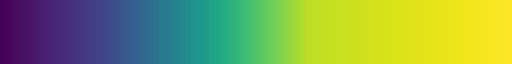

In [6]:
viridis = cm.get_cmap('viridis', 256)
newcolors1 = viridis(np.linspace(0, 0.2, 128))
newcolors2 = viridis(np.linspace(0.2, 0.9, 256))
newcolors3 = viridis(np.linspace(0.9, 1, 256))
newcolors = np.vstack((newcolors1, newcolors2, newcolors3))
cmap = ListedColormap(newcolors)
cmap.set_over(np.array([202,0,32,128]) / 255)
cmap.set_under(np.array([0,0,0,128]) / 255)
cmap

The velocity x component looks like this:

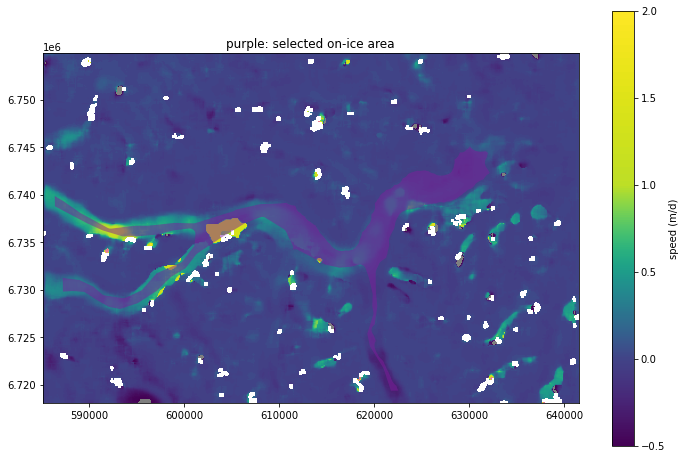

In [7]:
fig, ax0 = plt.subplots(1, 1, figsize=(12, 8))

with rasterio.open(demo.Vx) as v_src:
    v = v_src.read(1)
    show(v_src, ax=ax0, vmin=-0.5, vmax=2, cmap=cmap)
    
cbar =  fig.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=-0.5, vmax=2), cmap=cmap), ax=ax0)
cbar.set_label('speed (m/d)')
on_ice.plot(ax=ax0, alpha=0.5, facecolor='xkcd:purple')
ax0.set_title('purple: selected on-ice area');

In [8]:
sx, sy, z, thres_idx, sobelx, sobely = gftt.sobel_scattering(vxfile=demo.Vx, vyfile=demo.Vy, on_ice_area=in_shp, plot=False, return_sobelimage=True)

In [9]:
smx, smy, sobelm, sobelaz =gftt.sobel_test(vxfile=demo.Vx, vyfile=demo.Vy)

/home/jovyan/Projects/Github/glacier-ft-test/gftt/metrics.py:155: RuntimeWarning: divide by zero encountered in true_divide
  sobelaz = np.arctan(smy / smx)
/home/jovyan/Projects/Github/glacier-ft-test/gftt/metrics.py:155: RuntimeWarning: invalid value encountered in true_divide
  sobelaz = np.arctan(smy / smx)


In [10]:
exx, eyy, exy, duxdy, duydx, theta, e1, e2 = gftt.sobel_test2(vxfile=demo.Vx, vyfile=demo.Vy)

/home/jovyan/Projects/Github/glacier-ft-test/gftt/metrics.py:194: RuntimeWarning: divide by zero encountered in true_divide
  theta = 0.5 * np.arctan(2 * exy / (exx - eyy))
/home/jovyan/Projects/Github/glacier-ft-test/gftt/metrics.py:194: RuntimeWarning: invalid value encountered in true_divide
  theta = 0.5 * np.arctan(2 * exy / (exx - eyy))


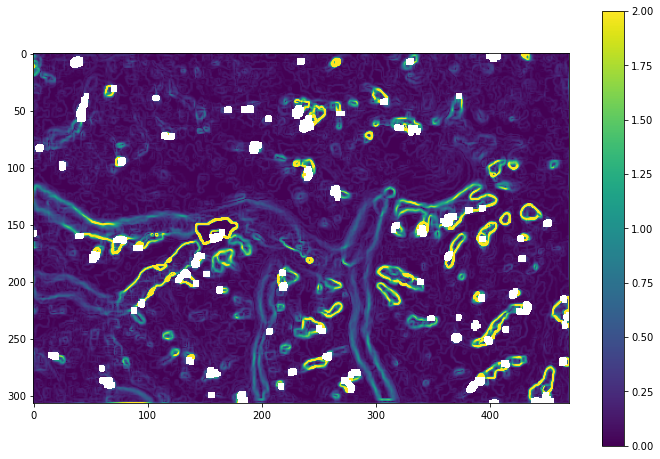

In [11]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 8))
sob = axtmp.imshow(sobelm, vmin=0, vmax=2)
fig.colorbar(sob, ax=axtmp)

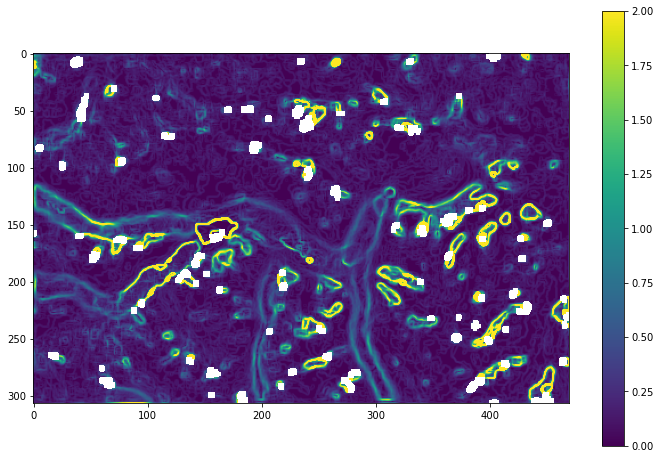

In [12]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 8))
sob = axtmp.imshow(np.sqrt(sobelx ** 2 + sobely ** 2), vmin=0, vmax=2)
fig.colorbar(sob, ax=axtmp)

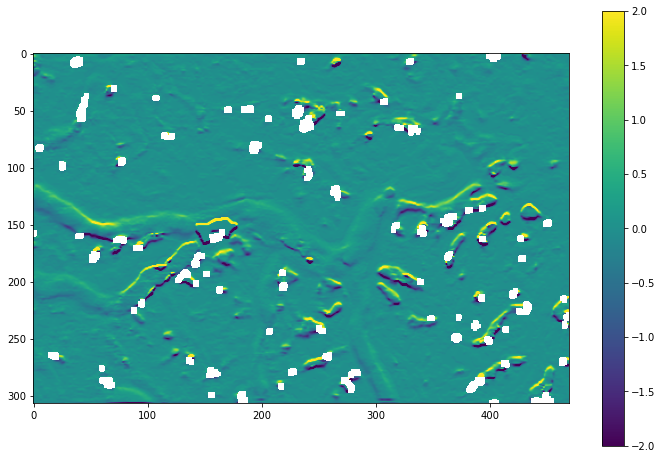

In [13]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 8))
sob = axtmp.imshow(smx, vmin=-2, vmax=2)
fig.colorbar(sob, ax=axtmp)

Text(0.5, 1.0, '$\\epsilon_{2}$')

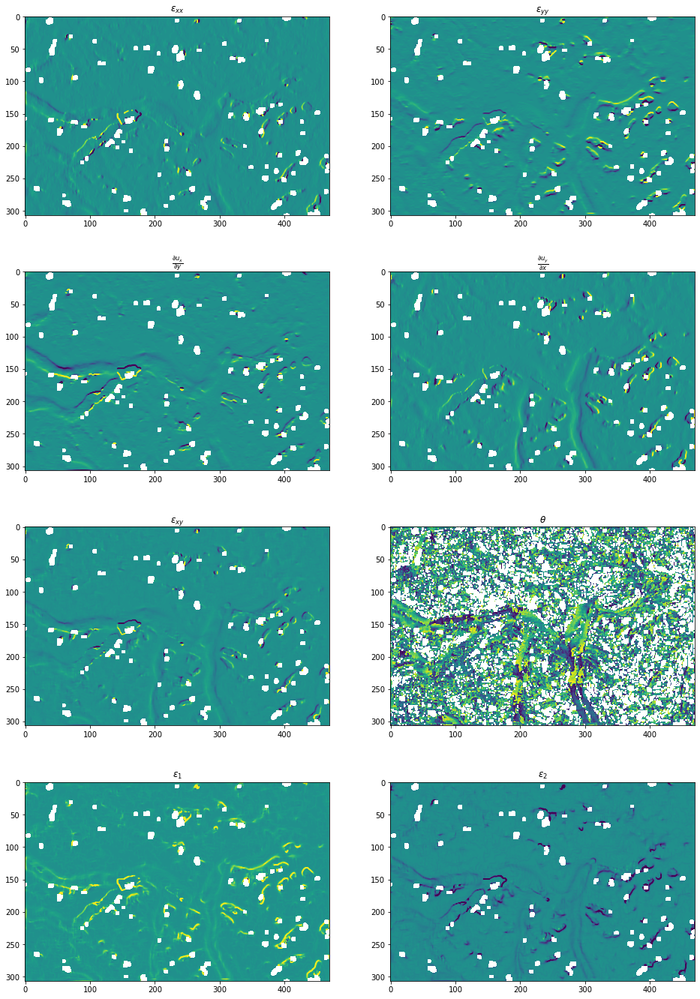

In [14]:
fig, axtmp = plt.subplots(4, 2, figsize=(16, 24))
axtmp[0, 0].imshow(exx, vmin=-2, vmax=2)
axtmp[0, 0].set_title(r'$\epsilon_{xx}$')
axtmp[0, 1].imshow(eyy, vmin=-2, vmax=2)
axtmp[0, 1].set_title(r'$\epsilon_{yy}$')
axtmp[1, 0].imshow(duxdy, vmin=-2, vmax=2)
axtmp[1, 0].set_title(r'$\frac{\partial u_x}{\partial y}$')
axtmp[1, 1].imshow(duydx, vmin=-2, vmax=2)
axtmp[1, 1].set_title(r'$\frac{\partial u_y}{\partial x}$')
axtmp[2, 0].imshow(exy, vmin=-2, vmax=2)
axtmp[2, 0].set_title(r'$\epsilon_{xy}$')
axtmp[2, 1].imshow(theta) # , vmin=-2, vmax=2)
axtmp[2, 1].set_title(r'$\theta$')
axtmp[3, 0].imshow(e1, vmin=-2, vmax=2)
axtmp[3, 0].set_title(r'$\epsilon_{1}$')
axtmp[3, 1].imshow(e2, vmin=-2, vmax=2)
axtmp[3, 1].set_title(r'$\epsilon_{2}$')
# fig.colorbar(sob, ax=axtmp)

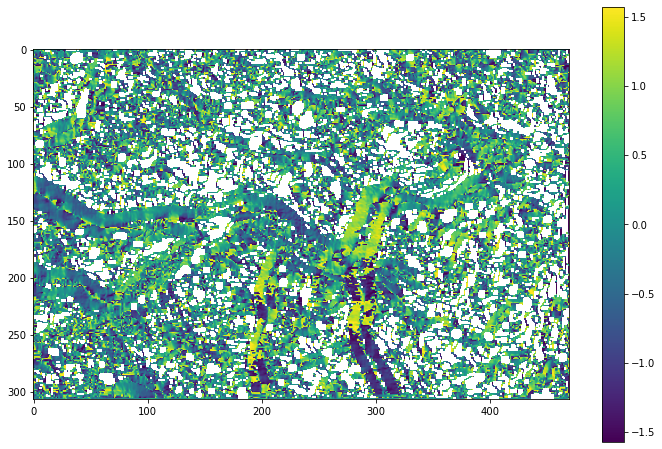

In [15]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 8))
sob = axtmp.imshow(sobelaz, vmin=-np.pi/2, vmax=np.pi/2)
fig.colorbar(sob, ax=axtmp)

<ipython-input-16-7f4182428b1d>:2: RuntimeWarning: divide by zero encountered in true_divide
  sob = axtmp.imshow(np.arctan(sobely / sobelx), vmin=-np.pi/2, vmax=np.pi/2)
<ipython-input-16-7f4182428b1d>:2: RuntimeWarning: invalid value encountered in true_divide
  sob = axtmp.imshow(np.arctan(sobely / sobelx), vmin=-np.pi/2, vmax=np.pi/2)


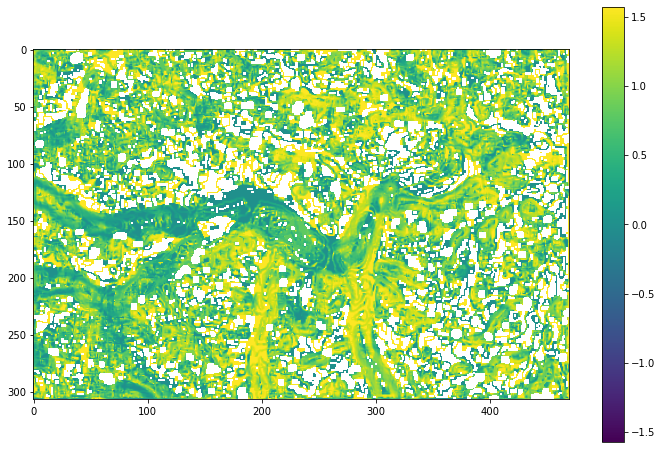

In [16]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 8))
sob = axtmp.imshow(np.arctan(sobely / sobelx), vmin=-np.pi/2, vmax=np.pi/2)
fig.colorbar(sob, ax=axtmp)

In [17]:
with rasterio.open(demo.Vx) as srcx, rasterio.open(demo.Vy) as srcy:
    vx_full = srcx.read(1)
    vy_full = srcy.read(1)
    
nonNaN_pts_idx = np.logical_and(vx_full > -9998, vy_full > -9998)
vx_full[~nonNaN_pts_idx] = np.nan  # replace NaN points with np.nan
vy_full[~nonNaN_pts_idx] = np.nan  # replace NaN points with np.nan

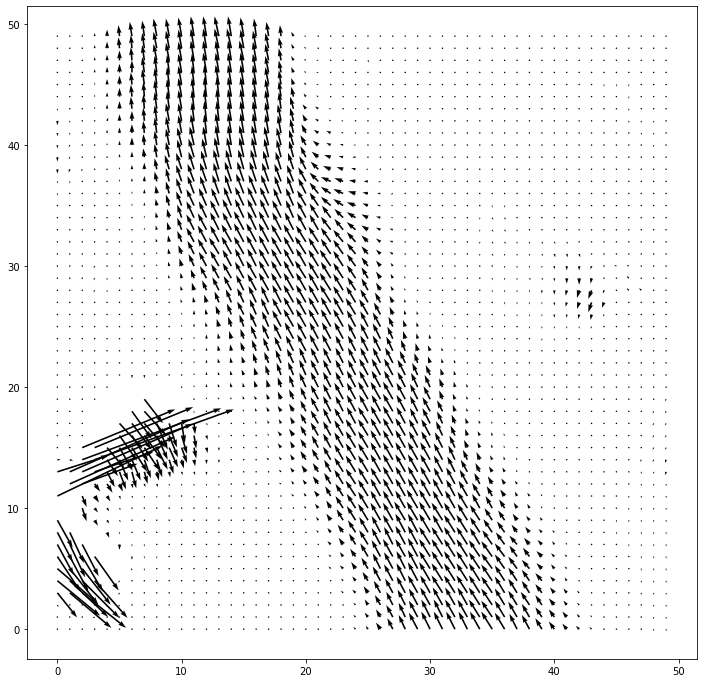

In [18]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(vx_full[250:300, 275:325]), np.flipud(vy_full[250:300, 275:325]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])

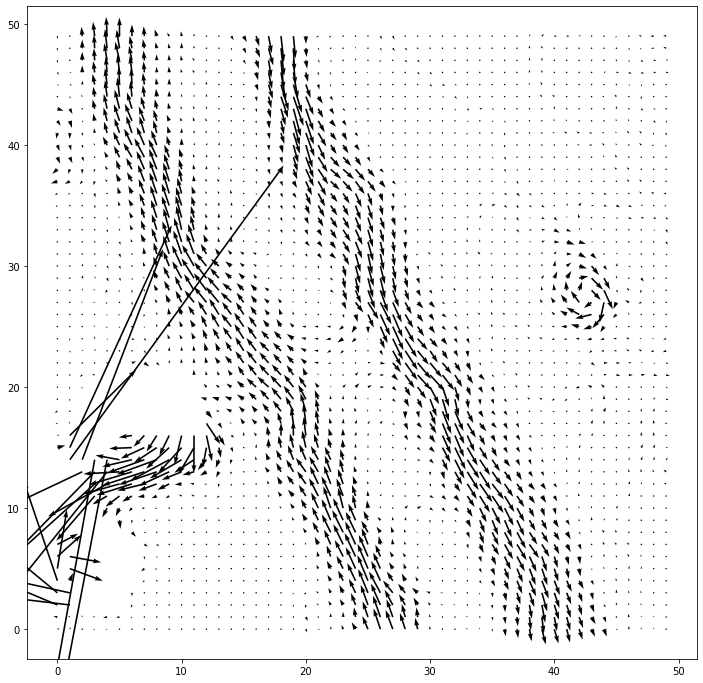

In [19]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(smx[250:300, 275:325]), np.flipud(smy[250:300, 275:325]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])

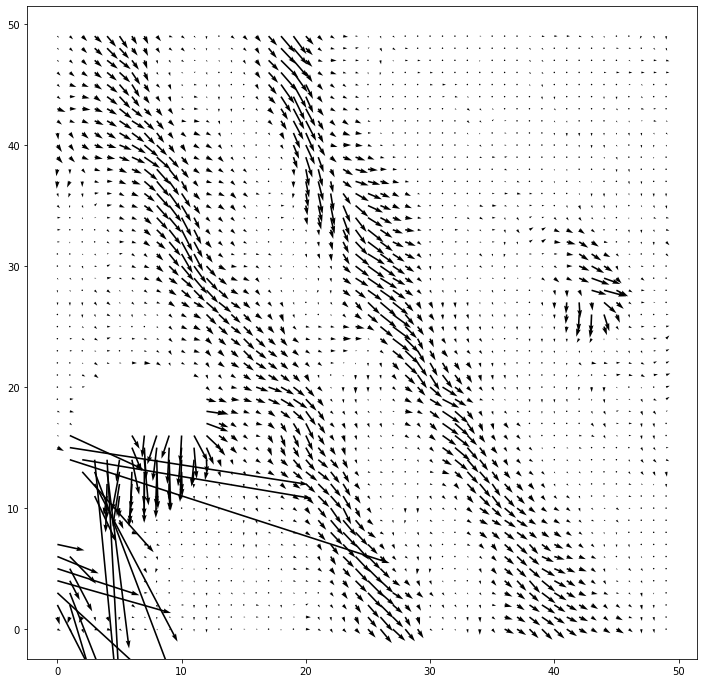

In [20]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[250:300, 275:325]), np.flipud(e2[250:300, 275:325]))

In [21]:
theta[250:300, 275:325]

array([[ 0.7853982 ,  0.7853982 , -0.7028238 , ...,  0.3926991 ,
        -0.5535744 , -0.5535744 ],
       [ 0.7853982 ,  0.7853982 ,  0.7853982 , ..., -0.        ,
        -0.7853982 ,  0.5535744 ],
       [ 0.7853982 ,  0.7853982 ,  0.7853982 , ..., -0.3926991 ,
        -0.        ,  0.09869778],
       ...,
       [ 0.1902532 ,  0.3702423 ,         nan, ...,  0.71444964,
         0.5535744 ,  0.7853982 ],
       [ 0.3341447 ,  0.4636476 ,  0.5151884 , ...,  0.3926991 ,
         0.3926991 , -0.3926991 ],
       [ 0.62452286, -0.27020976,  0.3926991 , ...,  0.5151884 ,
         0.3926991 ,         nan]], dtype=float32)

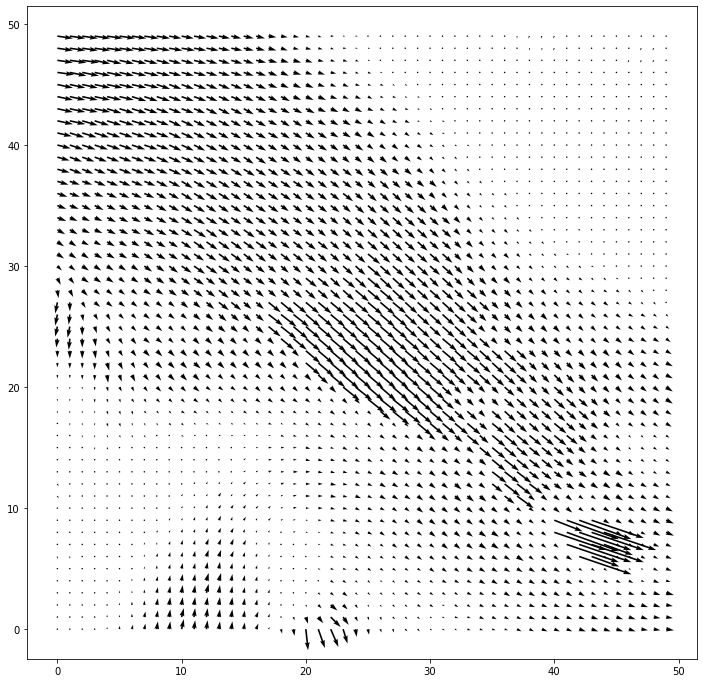

In [22]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(vx_full[140:190, 200:250]), np.flipud(vy_full[140:190, 200:250]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])

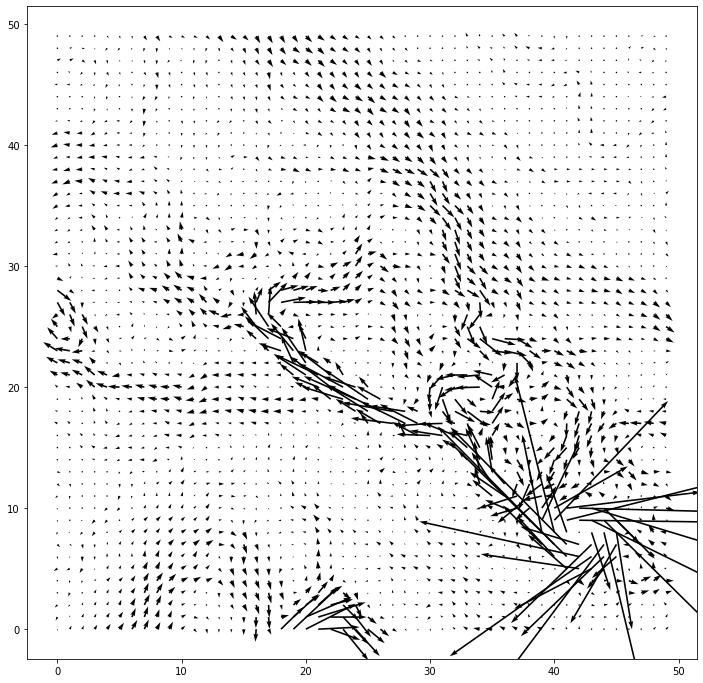

In [23]:
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(smx[140:190, 200:250]), np.flipud(smy[140:190, 200:250]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])

(-3.45, 72.45, -2.0500000000000003, 43.05)

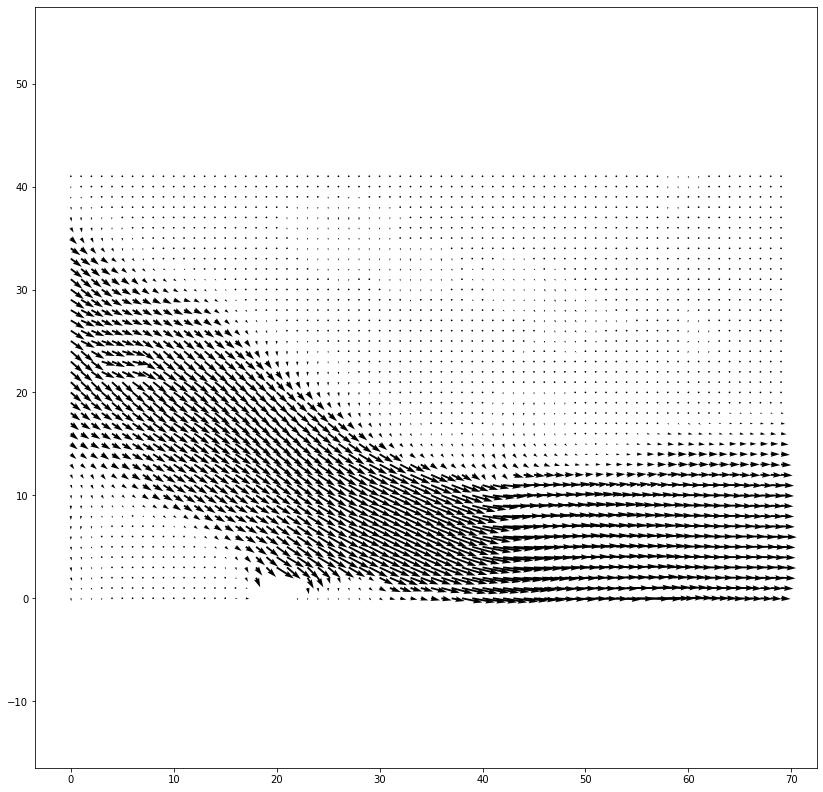

In [24]:
fig, axtmp = plt.subplots(1, 1, figsize=(14, 14))
axtmp.quiver(np.flipud(vx_full[120:162, 20:90]), np.flipud(vy_full[120:162, 20:90]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])
axtmp.axis('equal')

(-3.45, 72.45, -2.0500000000000003, 43.05)

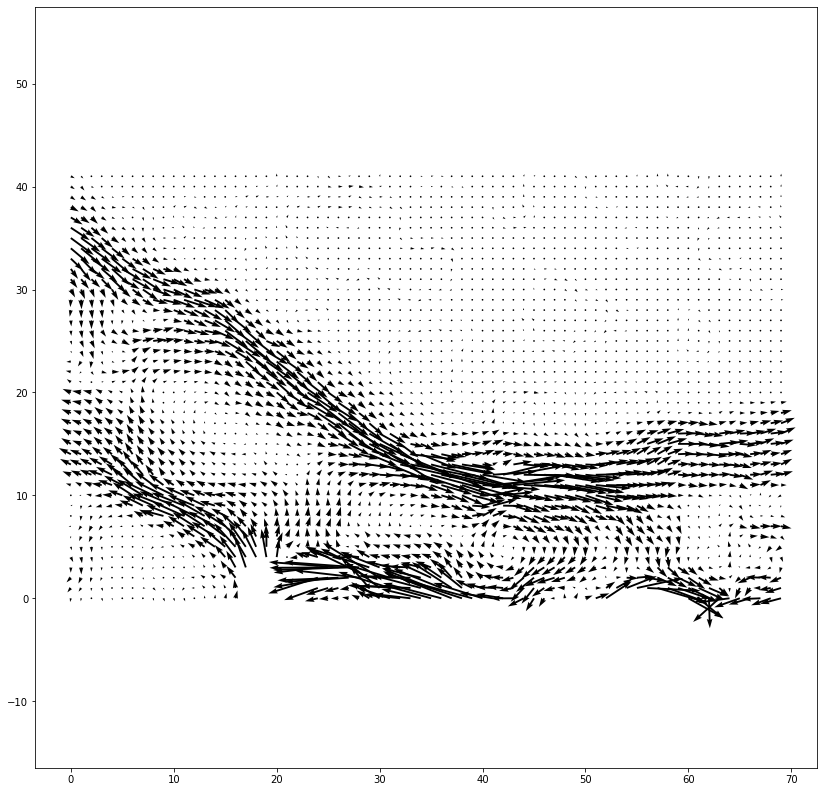

In [25]:
fig, axtmp = plt.subplots(1, 1, figsize=(14, 14))
axtmp.quiver(np.flipud(smx[120:162, 20:90]), np.flipud(smy[120:162, 20:90]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])
axtmp.axis('equal')

(-3.45, 72.45, -2.0500000000000003, 43.05)

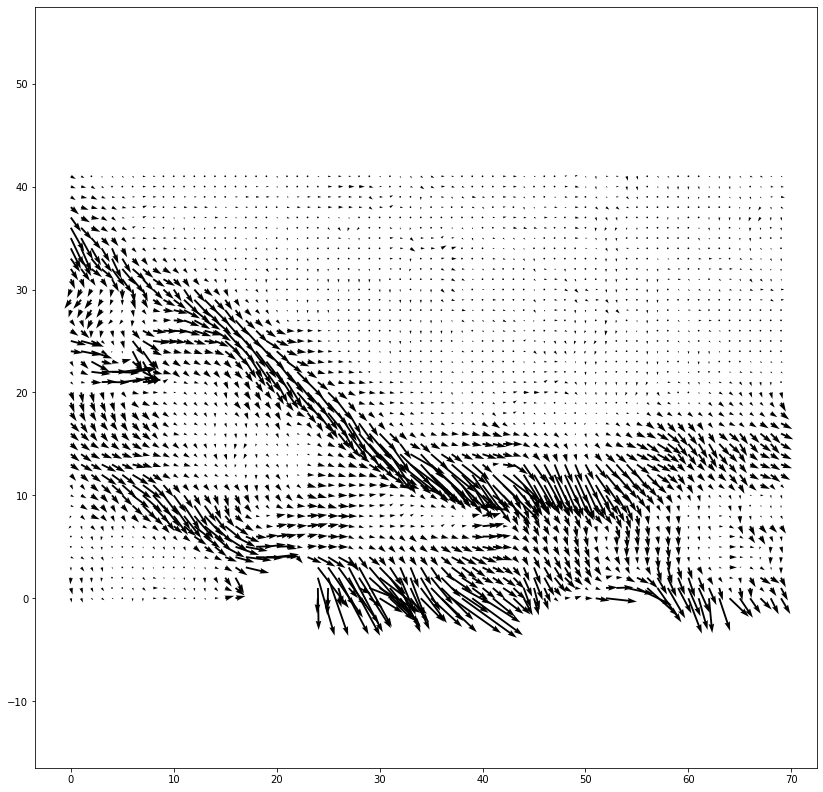

In [26]:
fig, axtmp = plt.subplots(1, 1, figsize=(14, 14))
axtmp.quiver(np.flipud(e1[120:162, 20:90]), np.flipud(e2[120:162, 20:90]))
# plt.quiver(vx_full[100:150, 200:250], vy_full[100:150, 200:250])
axtmp.axis('equal')

(-3.45, 72.45, -2.0500000000000003, 43.05)

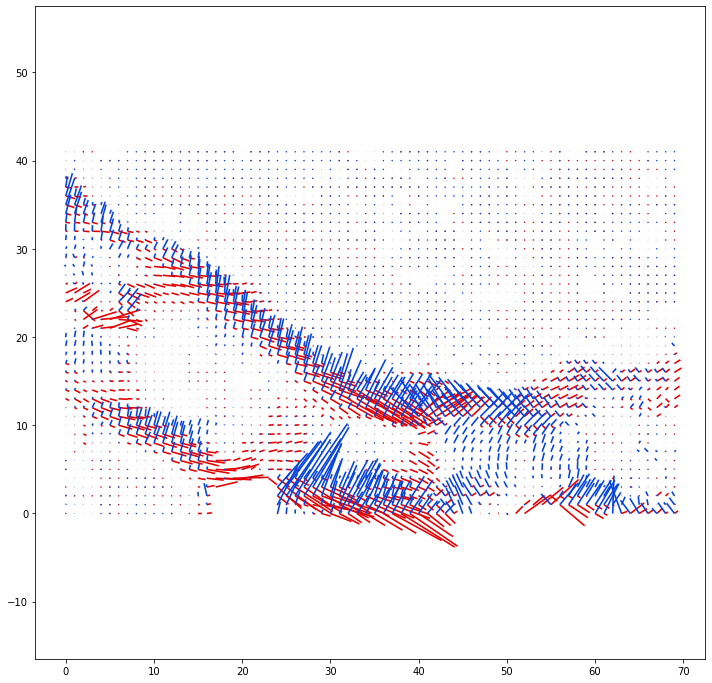

In [27]:
# red: tensile; blue: compression
# here angle has a minus sign because e1 and e2 originally follow the image axis instead of the cartesian axis.
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[120:162, 20:90]), np.zeros_like(e1[120:162, 20:90]), angles=-np.rad2deg(np.flipud(theta[120:162, 20:90])), headwidth=0, color='xkcd:red') #, pivot='middle')
axtmp.quiver(np.flipud(e2[120:162, 20:90]), np.zeros_like(e1[120:162, 20:90]), angles=-np.rad2deg(np.flipud(theta[120:162, 20:90]))+90, headwidth=0, color='xkcd:blue') # , pivot='middle')
axtmp.axis('equal')

[150, 50] and [150, 150]

In [28]:
e1[150, 50] * np.cos(theta[150, 50]) ** 2 + e2[150, 50] * np.sin(theta[150, 50]) ** 2

0.17578125412395848

In [29]:
exx[150, 50]

0.14648438

In [30]:
def judge(idx, idy):
    print('transformed back:{}'.format(e1[idx, idy] * np.cos(theta[idx, idy]) ** 2 + e2[idx, idy] * np.sin(theta[idx, idy]) ** 2))
    print('Exx:{}'.format(exx[idx,idy]))
    print('Eyy:{}'.format(eyy[idx,idy]))

In [31]:
judge(242, 205)

transformed back:0.6738280992218358
Exx:-0.05859375
Eyy:0.673828125


(-3.45, 72.45, -2.0500000000000003, 43.05)

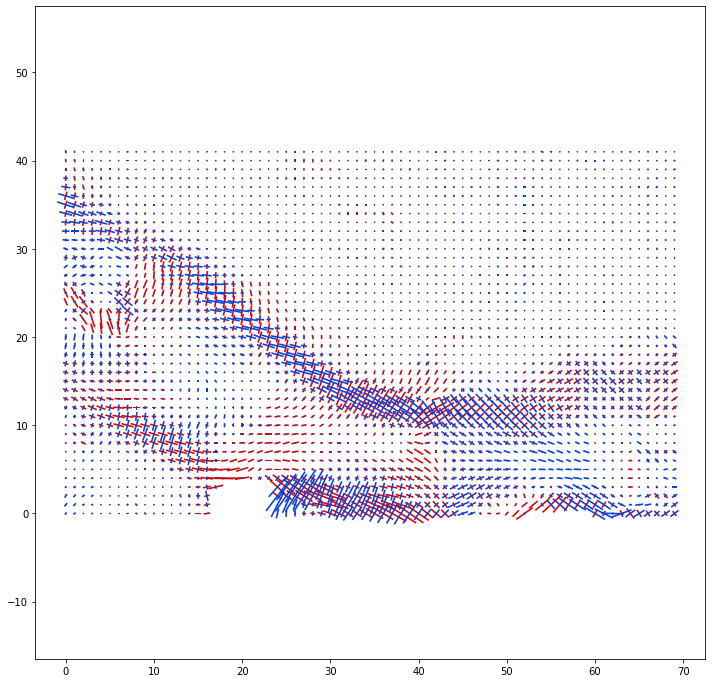

In [32]:
# considering the facts above...
angles = -np.rad2deg(np.flipud(theta[120:162, 20:90]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[120:162, 20:90]) > np.flipud(exx[120:162, 20:90])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
# here angle has a minus sign because e1 and e2 originally follow the image axis instead of the cartesian axis.
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[120:162, 20:90]), np.zeros_like(e1[120:162, 20:90]), angles=angles, scale_units='inches', scale=4, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[120:162, 20:90]), np.zeros_like(e1[120:162, 20:90]), angles=angles+90, scale_units='inches', scale=4, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')
axtmp.axis('equal')
# red: tensile; blue: compression

In [33]:
print(exx[155, 61:71])
print(eyy[155, 61:71])
print(exy[155, 61:71])
print(e1[155, 61:71])
print(e2[155, 61:71])
print(np.rad2deg(theta[155, 61:71]))

[ 0.32226562  0.08789062 -0.14648438 -0.234375   -0.29296875 -0.29296875
 -0.26367188 -0.3515625  -0.41015625 -0.38085938]
[0.20507812 0.234375   0.234375   0.20507812 0.14648438 0.1171875
 0.1171875  0.1171875  0.1171875  0.08789062]
[ 0.20507812  0.10253906  0.01464844 -0.01464844 -0.04394531 -0.05859375
 -0.04394531 -0.02929688 -0.05859375 -0.05859375]
[0.47695634 0.28714344 0.23493756 0.20556587 0.15083581 0.12539384
 0.12219234 0.11901146 0.12361947 0.09510385]
[ 0.05038741  0.03512219 -0.14704694 -0.23486274 -0.2973202  -0.3011751
 -0.2686767  -0.35338646 -0.41658822 -0.3880726 ]
[ 37.0273    -27.231161   -2.1993525   1.9070374   5.654966    7.9726977
   6.4973083   3.562508    6.264404    7.0181212]


[-23.580538 -28.7644   -29.368132 -23.12268  -18.434948 -14.87244
 -12.113872 -15.189563 -20.816769 -26.29732  -38.86761  133.93945
 126.44863  116.06251  116.713486 123.18531  124.09929  121.717476
 118.99731  112.5      106.235596 105.48188   73.15497   57.50845
  50.152428  56.309933  58.674942  57.9105    57.85498   59.872444]


(-1.4500000000000002, 30.45, -1.4500000000000002, 30.45)

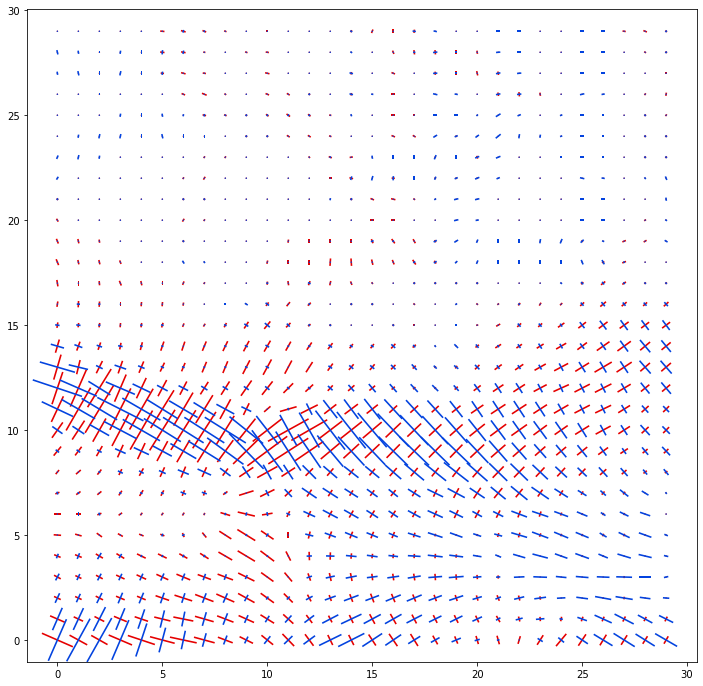

In [34]:
# considering the facts above...
angles = -np.rad2deg(np.flipud(theta[130:160, 51:81]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[130:160, 51:81]) > np.flipud(exx[130:160, 51:81])
angles[larger_eyy_idx] += 90              # when eyy > exx
print(angles[0, :])
# red: tensile; blue: compression
# here angle has a minus sign because e1 and e2 originally follow the image axis instead of the cartesian axis.
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[130:160, 51:81]), np.zeros_like(e1[130:160, 51:81]), angles=angles, scale_units='inches', scale=2, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[130:160, 51:81]), np.zeros_like(e1[130:160, 51:81]), angles=angles+90, scale_units='inches', scale=2, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')
axtmp.axis('equal')

[-23.580538 -28.7644   -29.368132 -23.12268  -18.434948 -14.87244
 -12.113872 -15.189563 -20.816769 -26.29732  -38.86761  133.93945
 126.44863  116.06251  116.713486 123.18531  124.09929  121.717476
 118.99731  112.5      106.235596 105.48188   73.15497   57.50845
  50.152428  56.309933  58.674942  57.9105    57.85498   59.872444]


(-1.4500000000000002, 30.45, -0.45, 9.45)

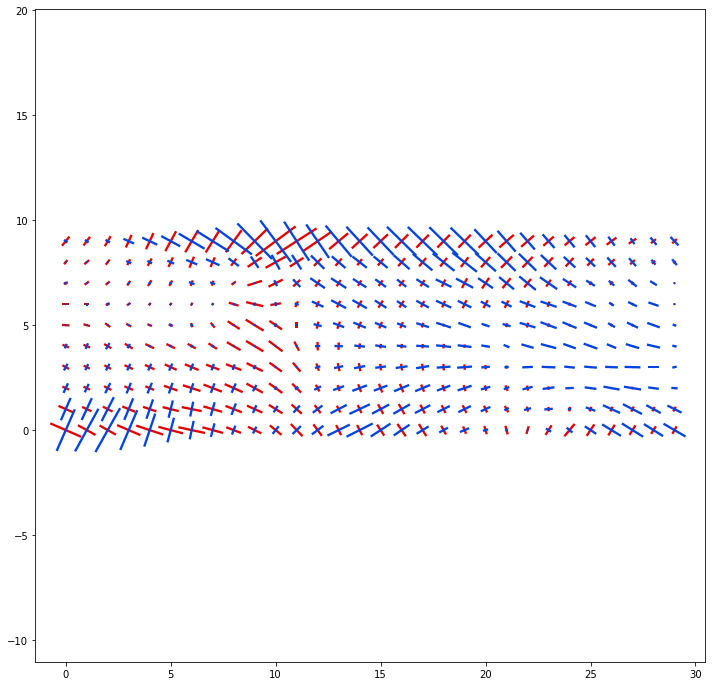

In [35]:
# considering the facts above...
angles = -np.rad2deg(np.flipud(theta[150:160, 51:81]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[150:160, 51:81]) > np.flipud(exx[150:160, 51:81])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
print(angles[0, :])
# red: tensile; blue: compression
# here angle has a minus sign because e1 and e2 originally follow the image axis instead of the cartesian axis.
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[150:160, 51:81]), np.zeros_like(e1[150:160, 51:81]), angles=angles, scale_units='inches', scale=2, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[150:160, 51:81]), np.zeros_like(e1[150:160, 51:81]), angles=angles+90, scale_units='inches', scale=2, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')
axtmp.axis('equal')

(-0.45, 9.45, -0.45, 9.45)

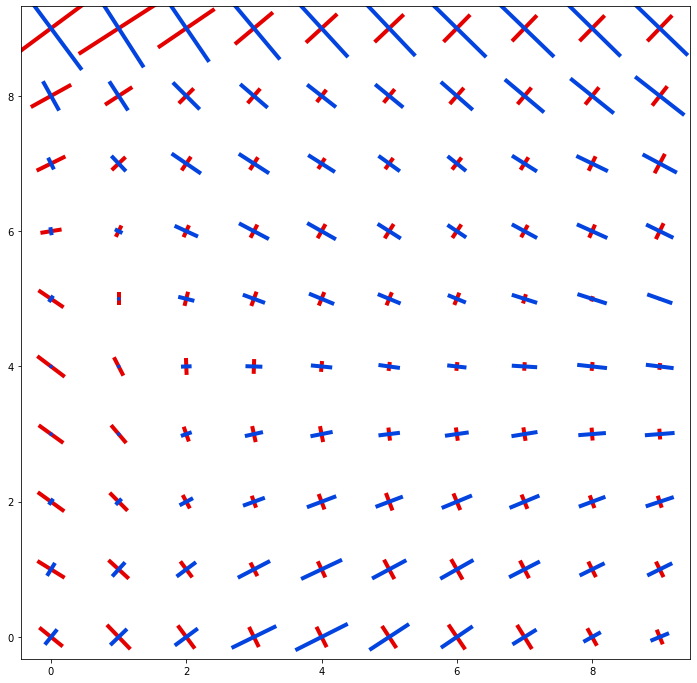

In [36]:
# considering the facts above...
angles = -np.rad2deg(np.flipud(theta[150:160, 61:71]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[150:160, 61:71]) > np.flipud(exx[150:160, 61:71])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
# red: tensile; blue: compression
# here angle has a minus sign because e1 and e2 originally follow the image axis instead of the cartesian axis.
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[150:160, 61:71]), np.zeros_like(e1[150:160, 61:71]), angles=angles, scale_units='inches', scale=1, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[150:160, 61:71]), np.zeros_like(e1[150:160, 61:71]), angles=angles+90, scale_units='inches', scale=1, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')
axtmp.axis('equal')

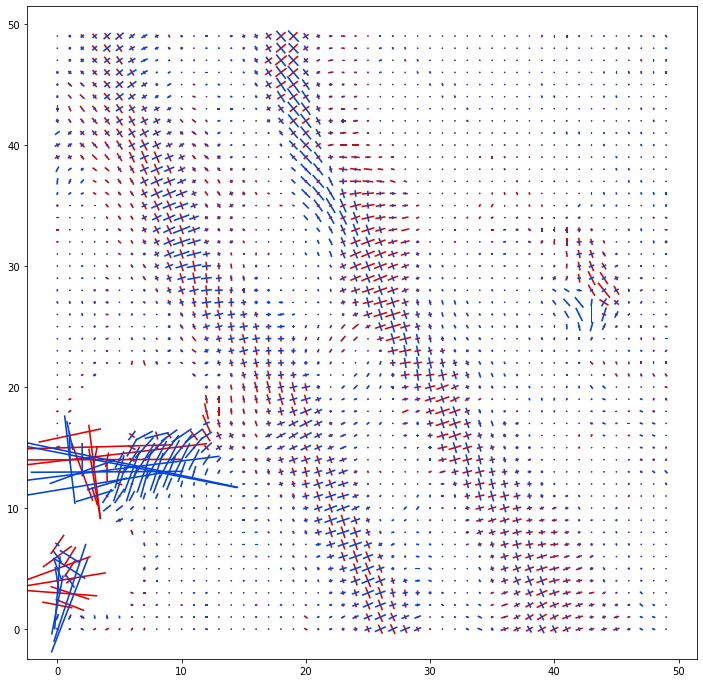

In [37]:
angles = -np.rad2deg(np.flipud(theta[250:300, 275:325]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[250:300, 275:325]) > np.flipud(exx[250:300, 275:325])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[250:300, 275:325]), np.zeros_like(e1[250:300, 275:325]), angles=angles, scale_units='inches', scale=3, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[250:300, 275:325]), np.zeros_like(e1[250:300, 275:325]), angles=angles+90, scale_units='inches', scale=3, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')

In [38]:
print(exx[250, 275:285])
print(eyy[250, 275:285])
print(exy[250, 275:285])
print(e1[250, 275:285])
print(e2[250, 275:285])
print(np.rad2deg(theta[250, 275:285]))

[ 0.          0.         -0.02929688 -0.02929688 -0.08789062 -0.14648438
 -0.1171875  -0.17578125 -0.1171875  -0.        ]
[-0.          0.          0.02929688  0.05859375  0.02929688  0.
  0.          0.02929688  0.08789062  0.08789062]
[0.05859375 0.1171875  0.17578125 0.24902344 0.3515625  0.36621094
 0.234375   0.19042969 0.13183594 0.07324219]
[0.05859375 0.1171875  0.17820594 0.26751968 0.327115   0.30022115
 0.18299447 0.1430394  0.15236944 0.12935965]
[-0.05859375 -0.1171875  -0.17820594 -0.23822281 -0.38570875 -0.44670552
 -0.30018198 -0.28952378 -0.18166631 -0.04146902]
[ 45.        45.       -40.268837 -39.996006 -40.268837 -39.34503
 -37.981876 -30.84962  -26.062506 -29.51812 ]


In [39]:
print(exx[250, 290:300])
print(eyy[250, 290:300])
print(exy[250, 290:300])
print(e1[250, 290:300])
print(e2[250, 290:300])
print(np.rad2deg(theta[250, 290:300]))

[ 0.1171875   0.08789062  0.08789062  0.02929688 -0.05859375  0.08789062
  0.1171875   0.14648438  0.17578125  0.08789062]
[-0.1171875  -0.1171875  -0.1171875  -0.1171875  -0.1171875  -0.1171875
 -0.1171875  -0.08789062 -0.02929688 -0.        ]
[-0.08789062 -0.16113281 -0.3076172  -0.5419922  -0.5566406  -0.2783203
 -0.1171875  -0.02929688  0.01464844 -0.01464844]
[0.14648438 0.17634381 0.30960855 0.50297326 0.46952045 0.2819598
 0.16572815 0.15009099 0.17682227 0.09026774]
[-0.14648438 -0.20564069 -0.33890542 -0.5908639  -0.6453017  -0.31125668
 -0.16572815 -0.09149724 -0.03033791 -0.00237712]
[-18.434948  -28.7644    -35.782524  -41.151974  -43.493603  -34.887566
 -22.5        -7.0181212   4.0650516  -9.217474 ]


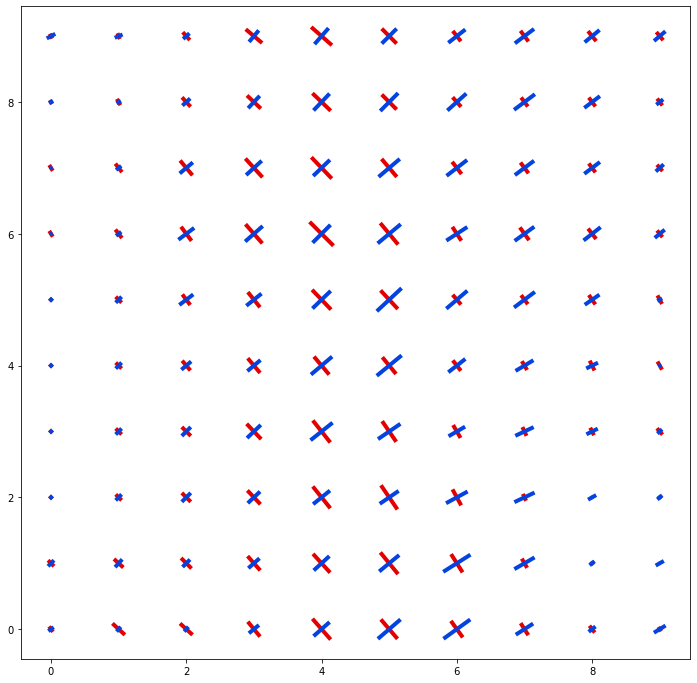

In [40]:
angles = -np.rad2deg(np.flipud(theta[245:255, 275:285]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[245:255, 275:285]) > np.flipud(exx[245:255, 275:285])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[245:255, 275:285]), np.zeros_like(e1[245:255, 275:285]), angles=angles, scale_units='inches', scale=1, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[245:255, 275:285]), np.zeros_like(e1[245:255, 275:285]), angles=angles+90, scale_units='inches', scale=1, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')

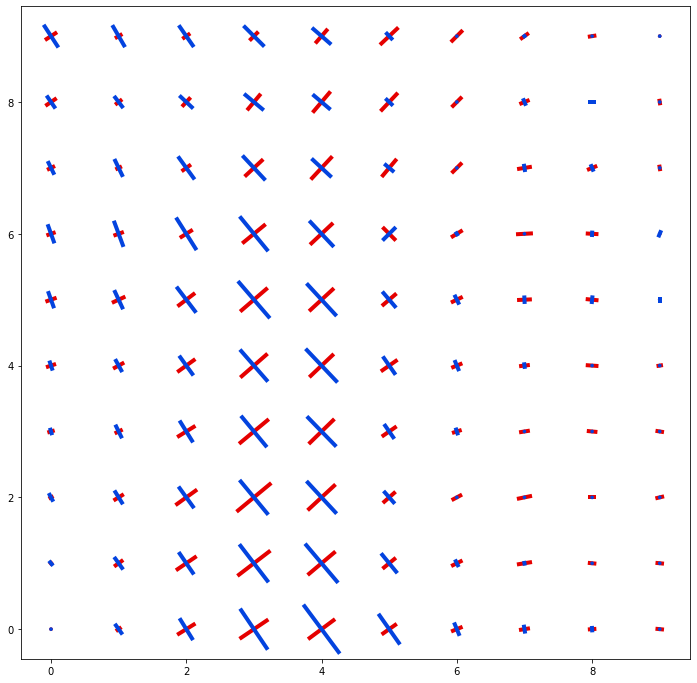

In [41]:
angles = -np.rad2deg(np.flipud(theta[245:255, 290:300]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[245:255, 290:300]) > np.flipud(exx[245:255, 290:300])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[245:255, 290:300]), np.zeros_like(e1[245:255, 290:300]), angles=angles, scale_units='inches', scale=1, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[245:255, 290:300]), np.zeros_like(e1[245:255, 290:300]), angles=angles+90, scale_units='inches', scale=1, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')

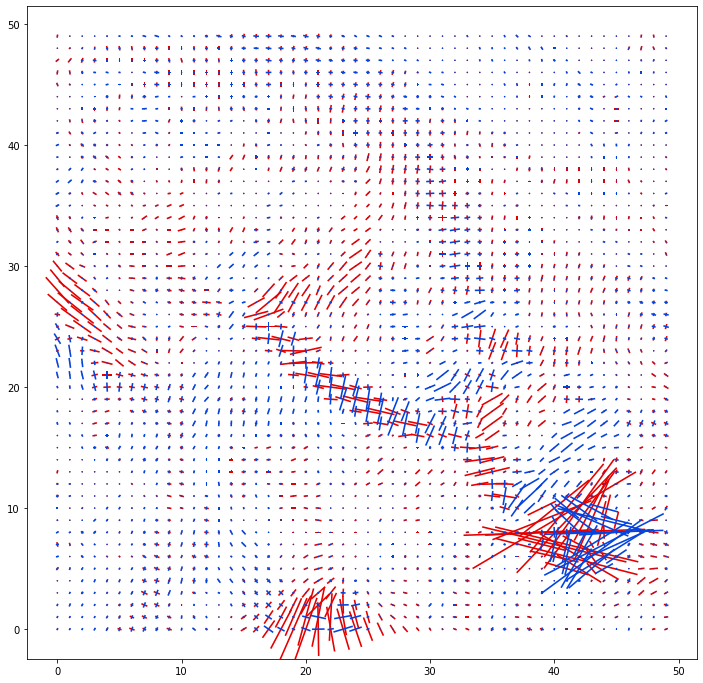

In [42]:
angles = -np.rad2deg(np.flipud(theta[140:190, 200:250]))            # when exx > eyy
larger_eyy_idx = np.flipud(eyy[140:190, 200:250]) > np.flipud(exx[140:190, 200:250])
angles[larger_eyy_idx] = angles[larger_eyy_idx] + 90              # when eyy > exx
fig, axtmp = plt.subplots(1, 1, figsize=(12, 12))
axtmp.quiver(np.flipud(e1[140:190, 200:250]), np.zeros_like(e1[140:190, 200:250]), angles=angles, scale_units='inches', scale=2, headwidth=1, headlength=0, headaxislength=0, color='xkcd:red', pivot='middle')
axtmp.quiver(np.flipud(e2[140:190, 200:250]), np.zeros_like(e1[140:190, 200:250]), angles=angles+90, scale_units='inches', scale=3, headwidth=1, headlength=0, headaxislength=0, color='xkcd:blue', pivot='middle')

In [43]:
e1.shape

(307, 470)

In [44]:
v.shape

(307, 470)

Now we can call the `sobel_scattering` function from GFTT and calculate flow statistics:

/home/jovyan/Projects/Github/glacier-ft-test/gftt/metrics.py:248: RuntimeWarning: divide by zero encountered in true_divide
  theta = 0.5 * np.arctan(2 * exy / (exx - eyy))
/home/jovyan/Projects/Github/glacier-ft-test/gftt/metrics.py:248: RuntimeWarning: invalid value encountered in true_divide
  theta = 0.5 * np.arctan(2 * exy / (exx - eyy))


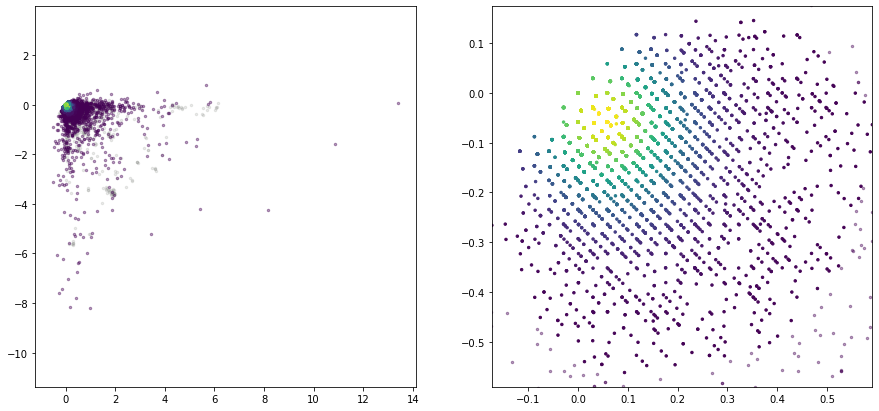

In [45]:
fig, ax1 = plt.subplots(1, 2, figsize=(15, 7))

for ax in ax1:
    ax.axis('equal')
e1s, e2s, z, thres_idx, exx, eyy, exy, duxdy, duydx, theta, e1, e2 = gftt.sobel_strain_test(vxfile=demo.Vx, vyfile=demo.Vy, on_ice_area=in_shp, plot=True, return_sobelimage=True, ax=ax1[0])
# e1s, e2s, z, thres_idx = gftt.sobel_strain_test(vxfile=demo.Vx, vyfile=demo.Vy, on_ice_area=in_shp, ax=ax1[0])
gftt.plot_off_ice_errors(e1s, e2s, z, thres_idx, ax=ax1[1])

# limrange = (0, 3)
# ax1[0].set_xlim(limrange)
# ax1[0].set_ylim(limrange)
# ax1[1].set_xlim(limrange)
# ax1[1].set_ylim(limrange)

In [46]:
e_min = np.minimum(np.abs(e1), np.abs(e2))

In [47]:
e_min = e_min.flatten()
e_min.shape

(144290,)

Text(0, 0.5, 'N')

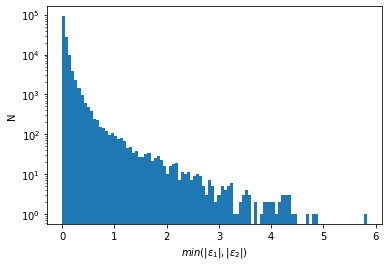

In [48]:
plt.hist(e_min, bins=100);
plt.yscale('log', nonpositive='clip')
plt.xlabel(r'$min(|\epsilon_1|, |\epsilon_2|)$')
plt.ylabel('N')

Here, x-axis is the (Sobel-flavored) gradient of flow speed along the x direction (m/day, per pixel), y-axis is the (Sobel-flavored) gradient of flow speed along the y direction (m/day, per pixel). Again, we randomly select 10,000 pixels and color code them based on the Gaussian kernel density estimate, and the other pixels are plotting as gray points. Transparent color points have a kernel density below a chosen confidence level, which is 3.0 by default and corresponds to a confidence level of 99.7%. 

#### 4. Off-ice error for 42 tests using the same Landsat 8 pair

Here's what the data ($V_x$ of all 42 tests) look like:

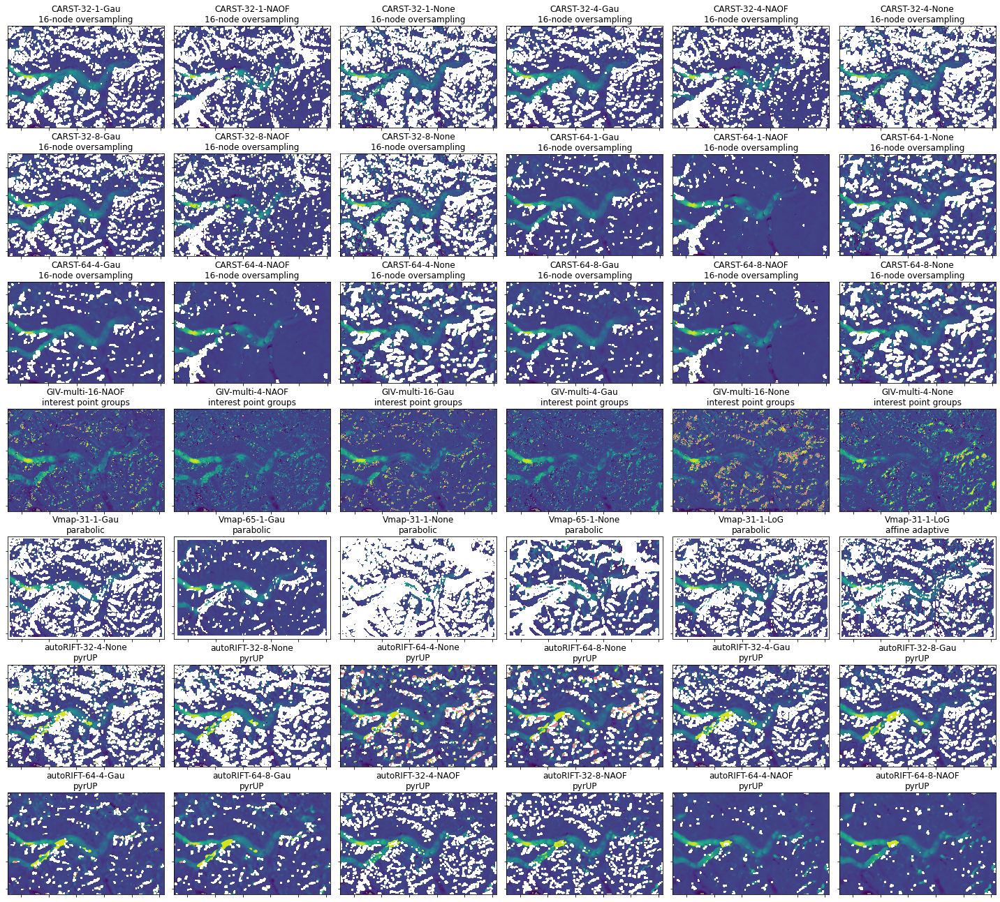

In [49]:
fig, ax2 = plt.subplots(7, 6, figsize=(20, 18))

demo = df
n = 0

for idx, row in demo.iterrows():
    label = '-'.join((row.Software, row['Chip (px)'], row['Resolution (px)'], row.Prefilter)) + '\n' + row.Subpixel
    ax_sel = ax2[n // 6, n % 6]
        
    with rasterio.open(row.Vx) as vx_src:
        show(vx_src, ax=ax_sel, vmin=-0.5, vmax=2, cmap=cmap)
    ax_sel.set_title(label)
    ax_sel.xaxis.set_ticklabels([])
    ax_sel.yaxis.set_ticklabels([])
        
    n += 1
    
plt.tight_layout()
fig.patch.set_facecolor('xkcd:white')
# fig.savefig('tmp.png')

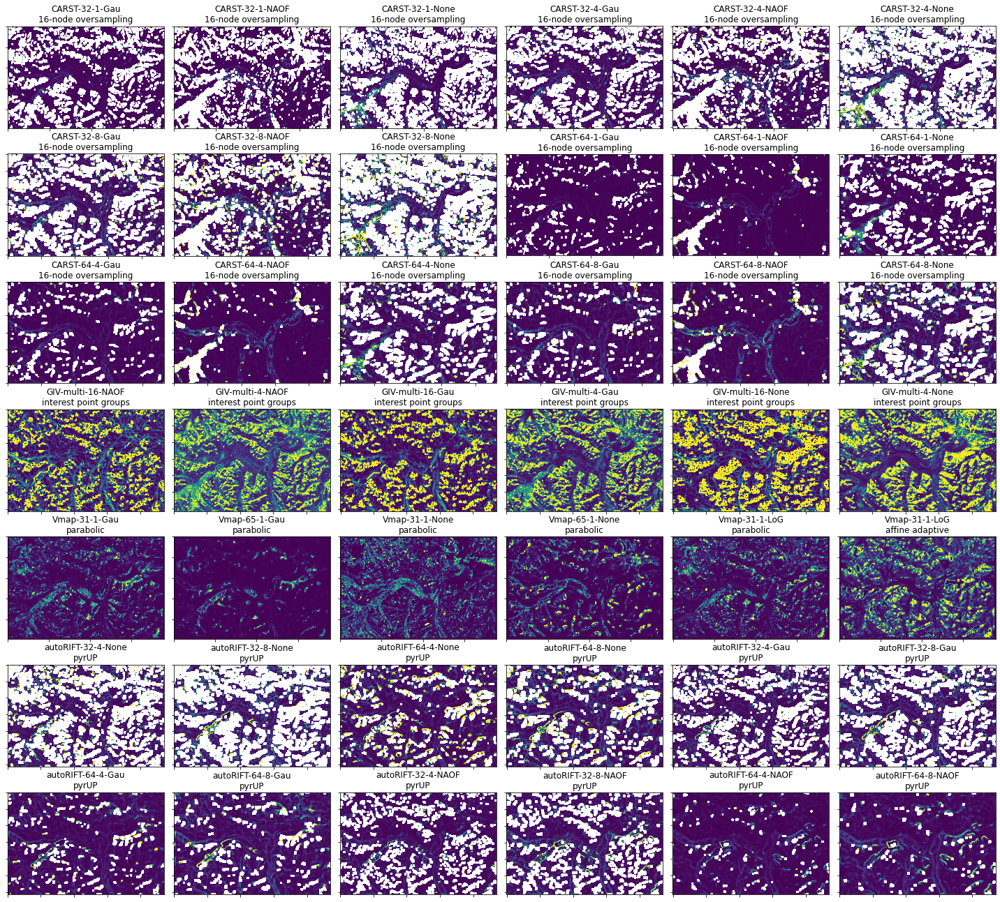

In [50]:
fig, ax2_ext = plt.subplots(7, 6, figsize=(20, 18))

demo = df
n = 0

for idx, row in demo.iterrows():
    label = '-'.join((row.Software, row['Chip (px)'], row['Resolution (px)'], row.Prefilter)) + '\n' + row.Subpixel
    ax_sel = ax2_ext[n // 6, n % 6]
    
    e1s, e2s, z, thres_idx, exx, eyy, exy, duxdy, duydx, theta, e1, e2 = gftt.sobel_strain_test(vxfile=row.Vx, vyfile=row.Vy, on_ice_area=in_shp, plot=False, return_sobelimage=True)
    sob = ax_sel.imshow(e1, vmin=0, vmax=2)
    
    # with rasterio.open(row.Vx) as vx_src:
    #     show(vx_src, ax=ax_sel, vmin=-0.5, vmax=2, cmap=cmap)
    ax_sel.set_title(label)
    ax_sel.xaxis.set_ticklabels([])
    ax_sel.yaxis.set_ticklabels([])
        
    n += 1
    
plt.tight_layout()
fig.patch.set_facecolor('xkcd:white')
# fig.savefig('tmp.png')

flow speed gradient plots for all 42 tests:

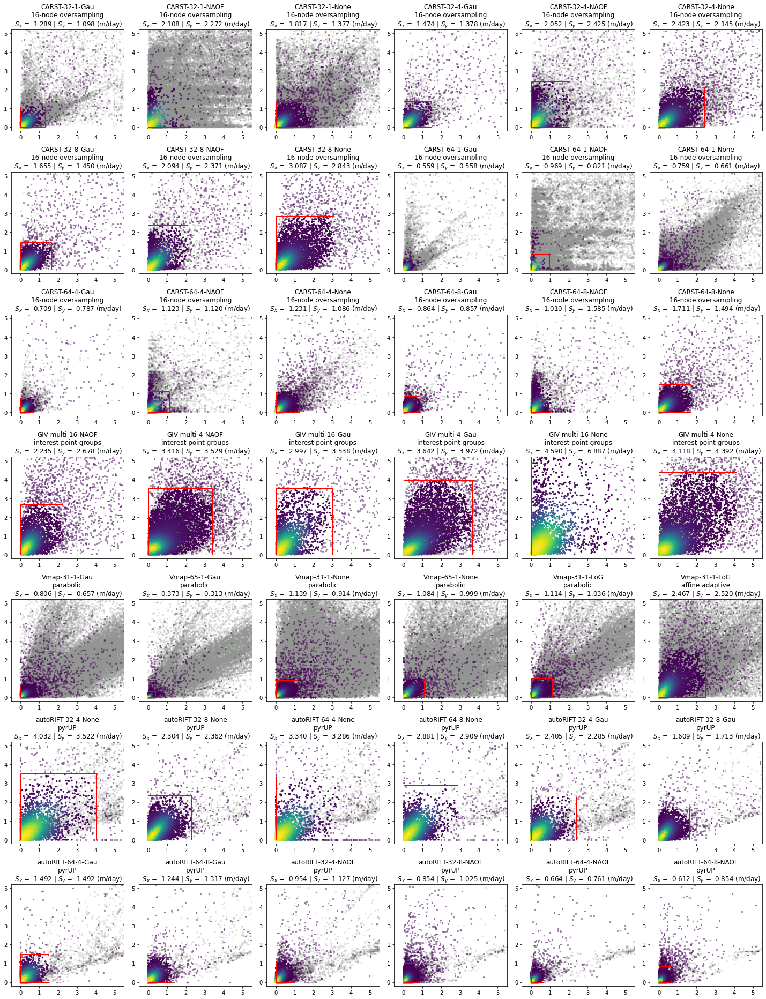

In [51]:
fig, ax3 = plt.subplots(7, 6, figsize=(20, 26))

demo = df
n = 0

for idx, row in demo.iterrows():
    label = '-'.join((row.Software, row['Chip (px)'], row['Resolution (px)'], row.Prefilter)) + '\n' + row.Subpixel
    ax_sel = ax3[n // 6, n % 6]
    ax_sel.axis('equal')
    
    if row.Software == 'GIV':
        sx, sy, z, thres_idx = gftt.sobel_scattering(vxfile=row.Vx, vyfile=row.Vy, wfile=row.Vx.replace('u_', 'pkr_'), on_ice_area=in_shp, max_n=10000, plot=True, ax=ax_sel)
    else:
        sx, sy, z, thres_idx = gftt.sobel_scattering(vxfile=row.Vx, vyfile=row.Vy, on_ice_area=in_shp, max_n=10000, plot=True, ax=ax_sel)
    # gftt.plot_off_ice_errors(vx, vy, z, thres_idx, ax=ax_sel, zoom=True)
    ax_sel.set_xlim(0, 5)
    ax_sel.set_ylim(0, 5)

    rect = patches.Rectangle((min(sx[thres_idx]), min(sy[thres_idx])), max(sx[thres_idx]) - min(sx[thres_idx]), max(sy[thres_idx]) - min(sy[thres_idx]), 
                              linewidth=1, edgecolor='r', facecolor='none')
    ax_sel.add_patch(rect)
    
    demo.loc[idx, 'SS-x'] = max(sx[thres_idx])
    demo.loc[idx, 'SS-y'] = max(sy[thres_idx])
    label += '\n $S_x$ = {:6.3f} | $S_y$ = {:6.3f} (m/day)'.format(demo.loc[idx, 'SS-x'], 
                                                                   demo.loc[idx, 'SS-y'])
    ax_sel.set_title(label)
    # ax_sel.xaxis.set_ticklabels([])
    # ax_sel.yaxis.set_ticklabels([])
    

        
    n += 1
    
    
plt.tight_layout()
fig.patch.set_facecolor('xkcd:white')
# fig.savefig('tmp.png')

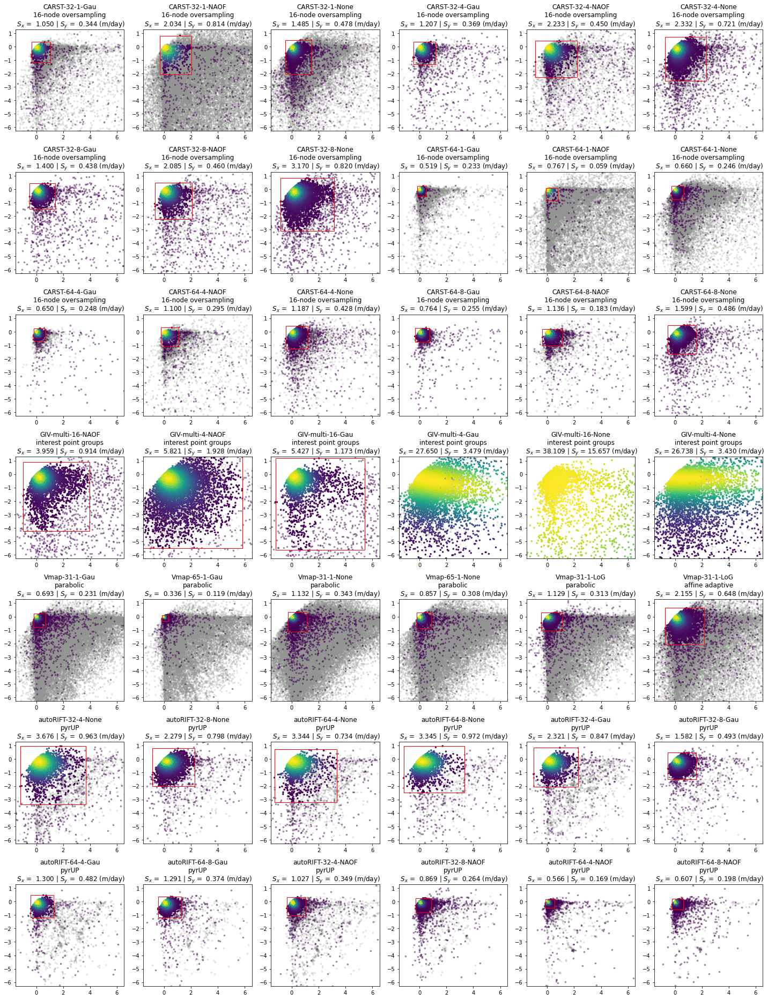

In [52]:
fig, ax3 = plt.subplots(7, 6, figsize=(20, 26))

demo = df
n = 0

for idx, row in demo.iterrows():
    label = '-'.join((row.Software, row['Chip (px)'], row['Resolution (px)'], row.Prefilter)) + '\n' + row.Subpixel
    ax_sel = ax3[n // 6, n % 6]
    ax_sel.axis('equal')
    
    # if row.Software == 'GIV':
    #     sx, sy, z, thres_idx = gftt.sobel_scattering(vxfile=row.Vx, vyfile=row.Vy, wfile=row.Vx.replace('u_', 'pkr_'), on_ice_area=in_shp, max_n=10000, plot=True, ax=ax_sel)
    # else:
    #     sx, sy, z, thres_idx = gftt.sobel_scattering(vxfile=row.Vx, vyfile=row.Vy, on_ice_area=in_shp, max_n=10000, plot=True, ax=ax_sel)
    e1s, e2s, z, thres_idx = gftt.sobel_strain_test(vxfile=row.Vx, vyfile=row.Vy, on_ice_area=in_shp, plot=True, return_sobelimage=False, ax=ax_sel)
    # gftt.plot_off_ice_errors(vx, vy, z, thres_idx, ax=ax_sel, zoom=True)
    ax_sel.set_xlim(-1, 6)
    ax_sel.set_ylim(-6, 1)

    rect = patches.Rectangle((min(e1s[thres_idx]), min(e2s[thres_idx])), max(e1s[thres_idx]) - min(e1s[thres_idx]), max(e2s[thres_idx]) - min(e2s[thres_idx]), 
                              linewidth=1, edgecolor='r', facecolor='none')
    ax_sel.add_patch(rect)
    
    demo.loc[idx, 'SS-x'] = max(e1s[thres_idx])
    demo.loc[idx, 'SS-y'] = max(e2s[thres_idx])
    label += '\n $S_x$ = {:6.3f} | $S_y$ = {:6.3f} (m/day)'.format(demo.loc[idx, 'SS-x'], 
                                                                   demo.loc[idx, 'SS-y'])
    ax_sel.set_title(label)
    # ax_sel.xaxis.set_ticklabels([])
    # ax_sel.yaxis.set_ticklabels([])
    

        
    n += 1
    
    
plt.tight_layout()
fig.patch.set_facecolor('xkcd:white')
# fig.savefig('tmp.png')

Have not considered the effect due to different skip size yet.

Results are attached to the right of the metadata sheet. (`SS-x` and `SS-y`)

In [13]:
# demo.to_csv('../results_agu21.csv', index=False)
demo

,Date,Chip (px),Resolution (px),Prefilter,Subpixel,Software,Vx,Vy,OIE-x,OIE-y,SS-x,SS-y
0,LS8-20180304-20180405,32,1,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.41748046875,0.4541015625,1.18154,1.08438
1,LS8-20180304-20180405,32,1,NAOF,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.41748046875,0.47607421875,2.097337,2.092728
2,LS8-20180304-20180405,32,1,None,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.673828125,0.5712890625,1.935036,1.365687
3,LS8-20180304-20180405,32,4,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.40283203125,0.41015625,1.425196,1.408842
4,LS8-20180304-20180405,32,4,NAOF,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.3515625,0.29296875,2.154491,2.66219
5,LS8-20180304-20180405,32,4,None,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.615234375,0.556640625,2.614244,2.271689
6,LS8-20180304-20180405,32,8,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.3826904296875,0.380859375,1.671977,1.564445
7,LS8-20180304-20180405,32,8,NAOF,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.3826904296875,0.369873046875,2.24912,2.432743
8,LS8-20180304-20180405,32,8,None,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.59326171875,0.5419921875,3.108024,2.969232
9,LS8-20180304-20180405,64,1,Gau,16-node oversampling,CARST,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,/home/jovyan/Projects/PX_comparison/PX/CARST/2...,0.2783203125,0.27099609375,0.563537,0.546919


And here's another figure showing the full extent of the flow velocity gradient plot.

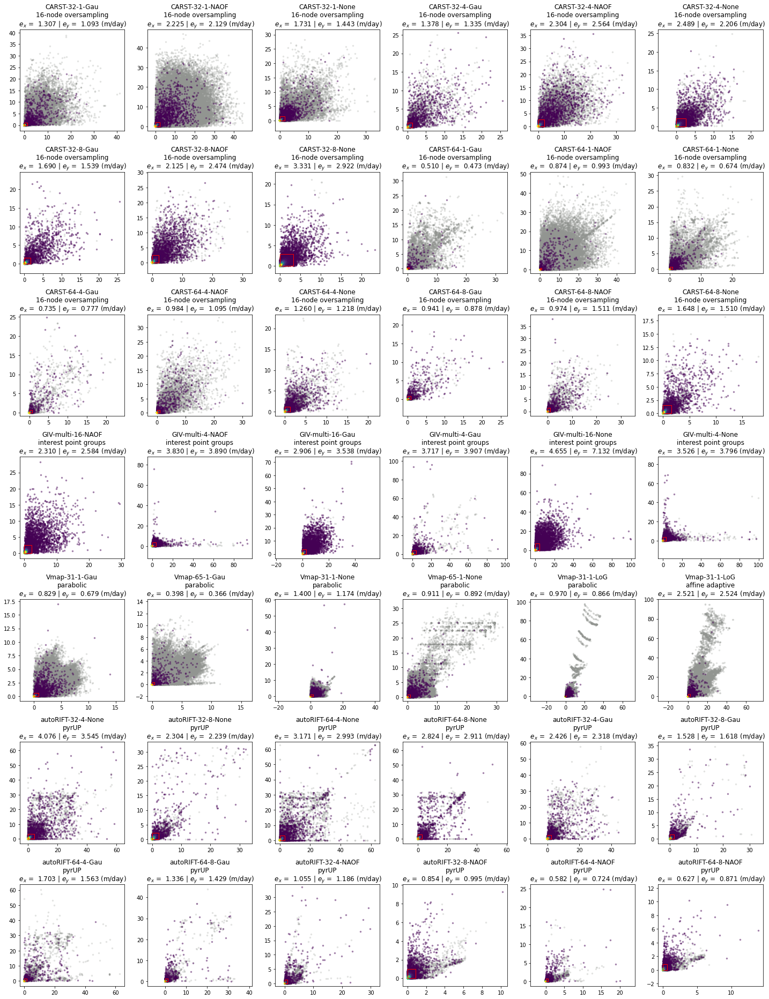

In [14]:
fig, ax4 = plt.subplots(7, 6, figsize=(20, 26))

n = 0
demo = df

for idx, row in demo.iterrows():
    label = '-'.join((row.Software, row['Chip (px)'], row['Resolution (px)'], row.Prefilter)) + '\n' + row.Subpixel
    ax_sel = ax4[n // 6, n % 6]
    ax_sel.axis('equal')

    if row.Software == 'GIV':
        sx, sy, z, thres_idx = gftt.sobel_scattering(vxfile=row.Vx, vyfile=row.Vy, wfile=row.Vx.replace('u_', 'pkr_'), on_ice_area=in_shp, max_n=10000, plot=True, ax=ax_sel)
    else:
        sx, sy, z, thres_idx = gftt.sobel_scattering(vxfile=row.Vx, vyfile=row.Vy, on_ice_area=in_shp, max_n=10000, plot=True, ax=ax_sel)
    # gftt.plot_off_ice_errors(vx, vy, z, thres_idx, ax=ax_sel, zoom=True)
    # ax_sel.set_xlim(-0.5, 0.5)
    # ax_sel.set_ylim(-0.5, 0.5)
    
    rect = patches.Rectangle((min(sx[thres_idx]), min(sy[thres_idx])), max(sx[thres_idx]) - min(sx[thres_idx]), max(sy[thres_idx]) - min(sy[thres_idx]), 
                              linewidth=1, edgecolor='r', facecolor='none')
    ax_sel.add_patch(rect)
    label += '\n $e_x$ = {:6.3f} | $e_y$ = {:6.3f} (m/day)'.format(max(sx[thres_idx]), 
                                                                   max(sy[thres_idx]))
    ax_sel.set_title(label)
    # ax_sel.xaxis.set_ticklabels([])
    # ax_sel.yaxis.set_ticklabels([])
        
    n += 1
    
plt.tight_layout()
fig.patch.set_facecolor('xkcd:white')

In [53]:
np.arctan(99999)

1.570786326694896